# Structure Isodistance Comparison to Areal Distance

Show the permeability of different street network types by comparing actual reach to areal distance

In [1]:
import common_options as co
from helpers import redistribute_graph
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.patches import Circle
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
import pandas as pd
import geopandas as gpd
from descartes import PolygonPatch
from shapely.geometry import Point, LineString, Polygon

%matplotlib inline
ox.config(log_console=True, use_cache=True)
ox.__version__

'1.1.0'

In [2]:
# Set different points

places = {
    'hoher_markt': (48.2112615, 16.3720356),
    'wilhelminenstrasse': (48.2161936, 16.3195007),
    'himmelstrasse': (48.2581337, 16.3376568),
    'sievering': (48.2558790, 16.3145457),
    'ballard': (47.68318224229275, -122.38760897549635),
    'lake_forest_park': (47.7756903, -122.2810785),
    }

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/utils_geo.py:101: UserWarning: The `redistribute_vertices` function has been deprecated and will be removed in a future release. Use the more efficient `utils_geo.interpolate_points` instead.
  warnings.warn(msg)
/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


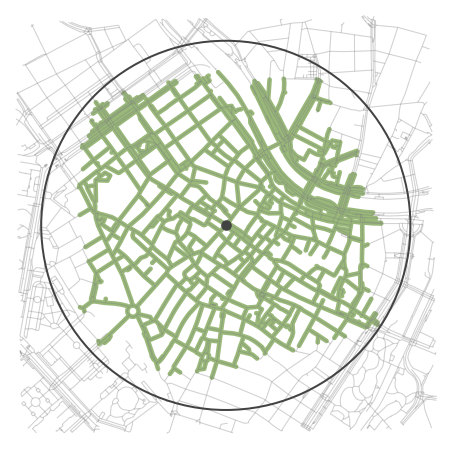

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/utils_geo.py:101: UserWarning: The `redistribute_vertices` function has been deprecated and will be removed in a future release. Use the more efficient `utils_geo.interpolate_points` instead.
  warnings.warn(msg)
/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


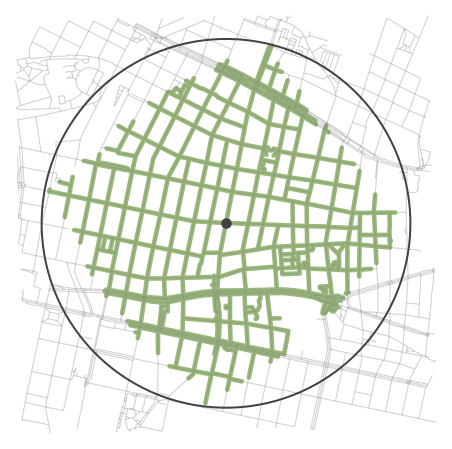

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/utils_geo.py:101: UserWarning: The `redistribute_vertices` function has been deprecated and will be removed in a future release. Use the more efficient `utils_geo.interpolate_points` instead.
  warnings.warn(msg)
/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


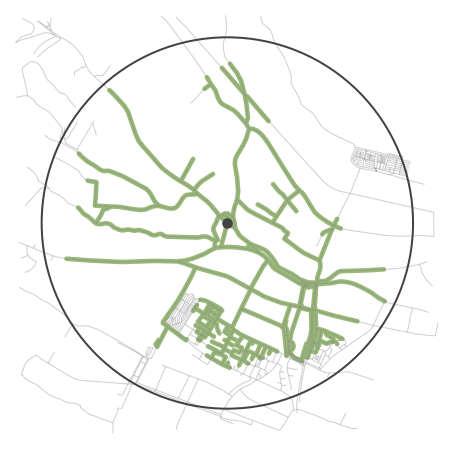

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/utils_geo.py:101: UserWarning: The `redistribute_vertices` function has been deprecated and will be removed in a future release. Use the more efficient `utils_geo.interpolate_points` instead.
  warnings.warn(msg)
/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


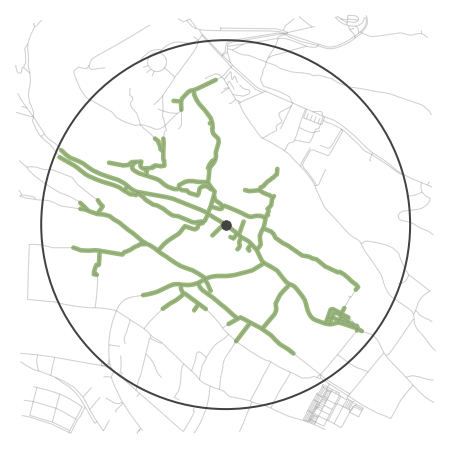

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/utils_geo.py:101: UserWarning: The `redistribute_vertices` function has been deprecated and will be removed in a future release. Use the more efficient `utils_geo.interpolate_points` instead.
  warnings.warn(msg)
/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


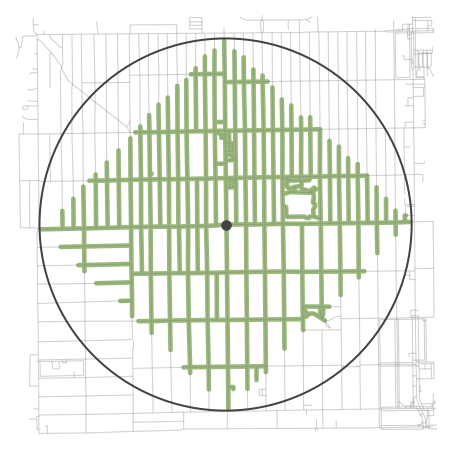

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/utils_geo.py:101: UserWarning: The `redistribute_vertices` function has been deprecated and will be removed in a future release. Use the more efficient `utils_geo.interpolate_points` instead.
  warnings.warn(msg)
/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


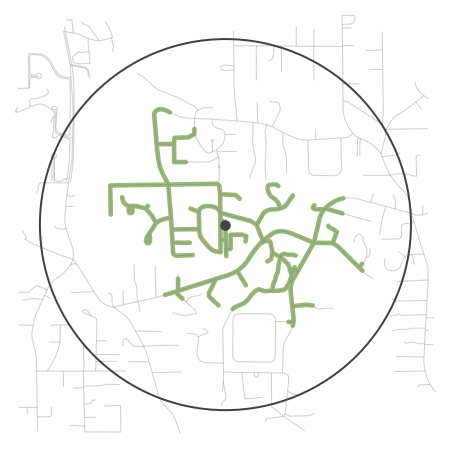

In [3]:
for place, coords in places.items():
    # get network around point (set distance + network type)
    G = ox.graph_from_point(coords, dist=900, simplify=False, custom_filter=co.walking_filter, **co.graph_download_options)
    G = ox.project_graph(G)
    G = redistribute_graph(G)

    # make isodistance map

    #parameters for isodistance graph
    trip_distance = 800 #in meter 
    edge_buff=10 #edge width
    node_buff=0
    color=co.col_green #color for isochrone

    #create isodistance from center node
    center_point = Point(*reversed(coords))
    center_point, crs = ox.projection.project_geometry(center_point)
    center_node = ox.get_nearest_node(G, (center_point.y, center_point.x))

    subgraph = nx.ego_graph(G, center_node, radius=trip_distance, distance='length', undirected=True)

    node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
    nodes_gdf = gpd.GeoDataFrame({'id': subgraph.nodes()}, geometry=node_points)
    nodes_gdf = nodes_gdf.set_index('id')

    edge_lines = []
    for n_fr, n_to in subgraph.edges():
        f = nodes_gdf.loc[n_fr].geometry
        t = nodes_gdf.loc[n_to].geometry
        edge_lookup = G.get_edge_data(n_fr, n_to)[0].get('geometry',  LineString([f,t]))
        edge_lines.append(edge_lookup)

    n = nodes_gdf.buffer(node_buff).geometry
    e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
    all_gs = list(n) + list(e)
    new_iso = gpd.GeoSeries(all_gs).unary_union

    #background graph
    fig, ax = ox.plot_graph(G, show=False, close=False, **co.graph_plot_options)

    patch = PolygonPatch(new_iso, fc=color, ec='none', alpha=0.6, zorder=-1)
    ax.add_patch(patch)

    # add circle around point for areal distance
    patch = Circle((center_point.x, center_point.y), radius=trip_distance, color=co.col_darkgray, fill=False, linewidth=2)
    ax.add_patch(patch)

    #add starting point on center_node
    ax.scatter(center_point.x, center_point.y, c=co.col_darkgray, s=90)

    #save graph
    fig.savefig('figures/structure_%s.svg' % place)
    fig.savefig('figures/structure_%s.png' % place, bbox_inches='tight')

    plt.show()
    plt.close()